In [40]:
%load_ext autoreload
%autoreload 2
%config Completer.use_jedi = False

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [1]:
import glob
paths = glob.glob('data/heuristics_images/*.jpg')
len(paths)

49983

In [58]:
import glob
paths = glob.glob('data/train_images/*.jpg')
len(paths)

4562

In [41]:
import pandas as pd
import torchvision

In [42]:
from heuristics.model.dataset import TorchDataset
from heuristics.model.settings import IMAGES_DIR
from heuristics.model.classifier import RoomModel
from heuristics.model.trainer import TrainerUtils
from heuristics.model.utils import get_preprocessor

from torch.utils.data import DataLoader
from torch.optim import AdamW
from torch import nn
import torch
from tqdm import tqdm_notebook

import numpy as np
import os
from sklearn.metrics import classification_report
from transformers import get_linear_schedule_with_warmup

from sklearn.metrics import (
    ConfusionMatrixDisplay,
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
)
import matplotlib.pyplot as plt

from heuristics.model.trainer import predict_img_batch

from PIL import Image

from heuristics.model.metrics import Metrics

from heuristics.model.settings import ROOM_TYPES, VALID_ROOM_TYPES, CLASS_NAME_MAPPING

from heuristics.model.utils import plot_imgs_with_labels, plot_sample, load_images
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True



import logging
logger = logging.getLogger()
logger.setLevel(logging.DEBUG)

In [43]:
# set your own paths
BASE_DIR_PATH = ''
BASE_DATA_DIR = 'data/'

TRAIN_IMGS_DATA_DIR = 'data/train_images/'
VAL_IMGS_DATA_DIR = 'data/val_images/'

TRAIN_DF_PATH = 'heuristics/data/train_df.csv'
VAL_DF_PATH = 'heuristics/data/val_df.csv'

In [44]:
train_df = pd.read_csv(TRAIN_DF_PATH)
val_df = pd.read_csv(VAL_DF_PATH)

In [45]:
%%time
# скачиваем картинки
# если не тут не скачивается, то лучше взять картинки с гугл диска
train_df['img_path'] = train_df['image_id_ext'].map(
    lambda x: os.path.join(TRAIN_IMGS_DATA_DIR, f'{int(x)}.jpg')
)
val_df['img_path'] = val_df['image_id_ext'].map(
    lambda x: os.path.join(VAL_IMGS_DATA_DIR, f'{int(x)}.jpg')
)

CPU times: total: 31.2 ms
Wall time: 23 ms


<AxesSubplot: ylabel='result'>

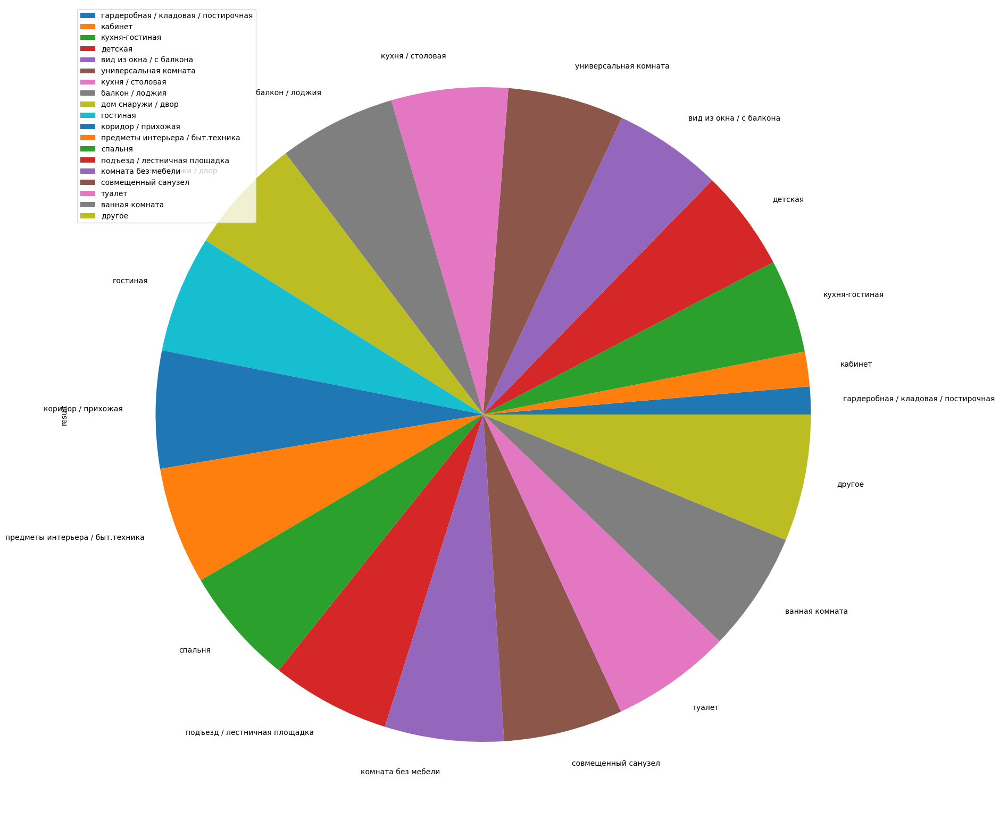

In [46]:
train_df['room_type'] = train_df['result'].map(CLASS_NAME_MAPPING)
train_df.groupby('room_type').count().sort_values('result').plot.pie(y='result', figsize=(20, 20))

In [47]:
columns = [TorchDataset.img_path_column, TorchDataset.label_column, TorchDataset.image_id_column, 'label', 'ratio']

In [48]:
train_df[columns].head(3)

,img_path,result,image_id_ext,label,ratio
0,data/train_images/16028356846.jpg,9,16028356846,совмещенный санузел,1.000000
1,data/train_images/16029739656.jpg,1,16029739656,кухня-гостиная,0.666667
2,data/train_images/15209120394.jpg,10,15209120394,коридор / прихожая,1.000000


In [49]:
val_df[columns].head(3)

,img_path,result,image_id_ext,label,ratio
0,data/val_images/14443810553.jpg,12,14443810553,балкон / лоджия,1.000000
1,data/val_images/14488540893.jpg,6,14488540893,детская,0.666667
2,data/val_images/14472154239.jpg,3,14472154239,гостиная,1.000000


In [50]:
train_df['ratio'].value_counts()

1.000000    2859
0.666667    1695
0.600000       6
0.800000       2
Name: ratio, dtype: int64

## Обучаем модель

In [51]:
dataset_train = TorchDataset(image_dir=IMAGES_DIR, df=train_df, transformer=get_preprocessor())
dataset_val = TorchDataset(image_dir=IMAGES_DIR, df=val_df, transformer=get_preprocessor())
train_dataloader = DataLoader(dataset_train, batch_size=32, shuffle=True)
val_dataloader = DataLoader(dataset_val, batch_size=32, shuffle=False)

In [52]:
device = 'cpu' #cida better
room_clf = RoomModel(num_classes=len(ROOM_TYPES))

optimizer = AdamW(room_clf.parameters(), lr=0.0002)
room_clf = room_clf.to(device)

metrics_scorer = Metrics(class_mapping=CLASS_NAME_MAPPING)
trainer = TrainerUtils(
    device=device, experiment_tag='resnet18_baseline', model_checkpoint_path='data/models/'
)
trainer.training_loop(
    room_clf,
    train_dataloader,
    val_dataloader,
    optimizer,
    epoch_num=20,
    validate_every=10,
    verbose=True,
    metrics_scorer=metrics_scorer,
)

c:\Users\dyush\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\dyush\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


  0%|          | 0/143 [00:00<?, ?it/s]

UnidentifiedImageError: cannot identify image file 'data/train_images/15200537002.jpg'

In [ ]:
def score_model(model_name, test_dataloader, trainer, metrics_scorer, base_model_path='/app/data/models'):
    model_path = os.path.join(base_model_path, f'model_{model_name}')
    room_clf, meta_info = RoomModel.from_pretrained(model_path)
    test_predictions, test_probas, test_targets, _ = trainer.predict(
        room_clf, test_dataloader, with_all_probas=False)

    scores_df_base = metrics_scorer.get_accuracies_df(test_targets, test_predictions)
    
    return scores_df_base, test_targets, test_predictions

In [ ]:
scores_df_base, val_targets, val_predictions = score_model(
    'resnet18_baseline', val_dataloader, trainer, metrics_scorer
)
scores_df_base

  0%|          | 0/16 [00:00<?, ?it/s]

,index,precision,recall,f1-score,support
21,weighted avg,0.686800,0.666000,0.653328,500.0
20,macro avg,0.675498,0.656284,0.642316,500.0
19,micro avg,0.680982,0.666000,0.673407,500.0
6,детская,0.705882,0.352941,0.470588,34.0
0,кухня / столовая,0.818182,0.794118,0.805970,34.0
8,туалет,0.964286,0.818182,0.885246,33.0
15,подъезд / лестничная площадка,0.900000,0.818182,0.857143,33.0
9,совмещенный санузел,0.818182,0.870968,0.843750,31.0
3,гостиная,0.606061,0.666667,0.634921,30.0
10,коридор / прихожая,0.709677,0.758621,0.733333,29.0


DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f43cdfd4dc0>
DEBUG:matplotlib.colorbar:Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f43cdfd4dc0> on colorbar
DEBUG:matplotlib.colorbar:Setting pcolormesh


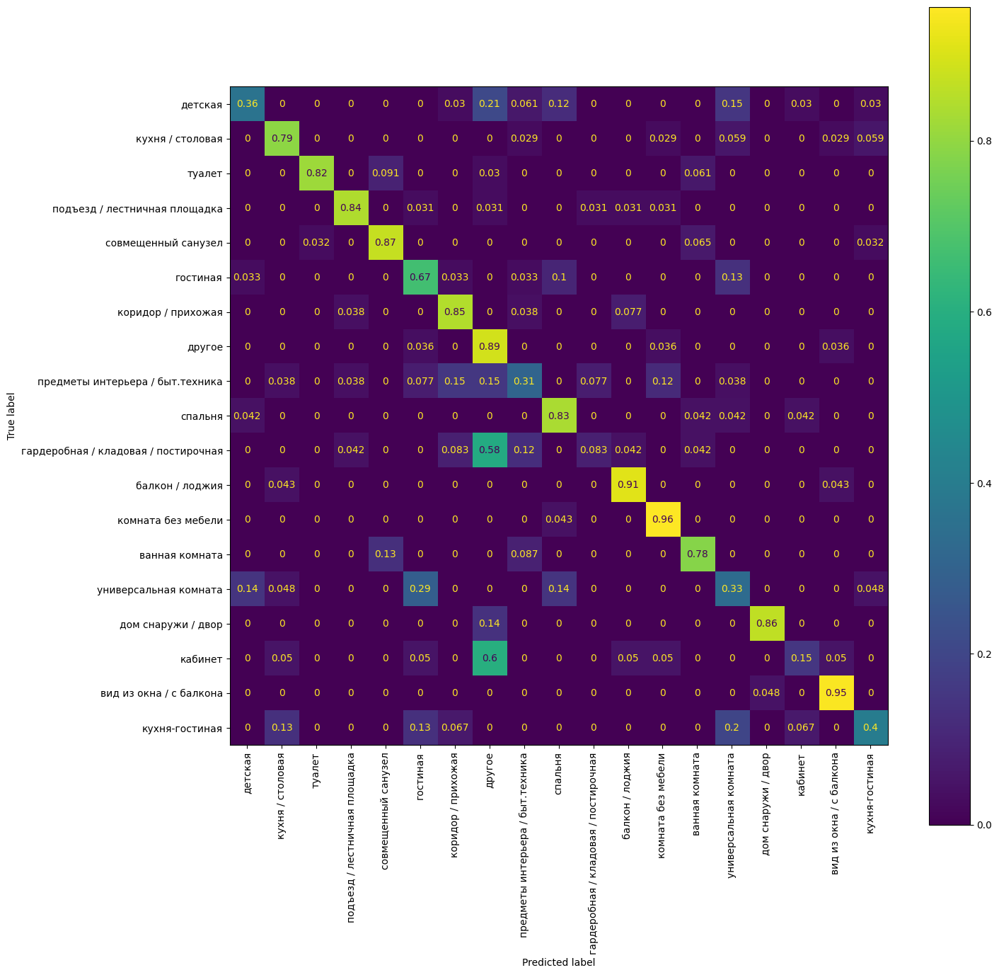

In [ ]:
metrics_scorer.plot_cf_matrix(val_targets, val_predictions)

## Добавим эвристик для гардробных
### С весами
    loss_fn = torch.nn.CrossEntropyLoss(reduction='none')
    loss_batch = loss_fn(logits, labels)
    loss_batch = loss_batch * sample_weights

    loss = loss_batch.mean()

In [ ]:
HEUR_IMG_DIR = '/data/heuristics_images/'
heuristics_df_1 = pd.read_csv(os.path.join(BASE_DIR_PATH, 'new_data/heur_dress_room.csv'))
heuristics_df_1['result'] = 11
heuristics_df_1['label'] = 'гардеробная / кладовая / постирочная'

# heuristics_df_2 = pd.read_csv('/heuristics/data/heur_cabinet.csv').sample(1000)
# heuristics_df_2['result'] = 5
# heuristics_df_2['label'] = 'кабинет'

heuristics_df = pd.concat([heuristics_df_1])

heuristics_df['img_path'] = heuristics_df['image'].map(
    lambda x: os.path.join(HEUR_IMG_DIR, os.path.split(x)[-1])
)

In [ ]:
heuristics_df['ratio'] = 1

train_df[TorchDataset.sample_weight_column] = 1.

heuristics_df[TorchDataset.sample_weight_column] = 0.3

train_df_heur = pd.concat([
    train_df, heuristics_df[columns + [TorchDataset.sample_weight_column]]
])

dataset_train_heur = TorchDataset(image_dir=IMAGES_DIR, df=train_df_heur, transformer=get_preprocessor())
train_dataloader_heur = DataLoader(dataset_train_heur, batch_size=32, shuffle=True)

In [ ]:
device = 'cuda:1'
room_clf = RoomModel(num_classes=len(ROOM_TYPES))


optimizer = AdamW(room_clf.parameters(), lr=0.0002)
room_clf = room_clf.to(device)


trainer = TrainerUtils(
    device=device, experiment_tag='resnet18_baseline_dress_room', model_checkpoint_path='/app/data/models/'
)
trainer.training_loop(
    room_clf,
    train_dataloader_heur,
    val_dataloader,
    optimizer,
    epoch_num=20,
    validate_every=10,
    verbose=True,
    metrics_scorer=metrics_scorer,
)

  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 0: 0.582
INFO:root:val f1_score after epoch 0: 0.5623


  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 1: 0.592
INFO:root:val f1_score after epoch 1: 0.5816


  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 2: 0.634
INFO:root:val f1_score after epoch 2: 0.618


  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 3: 0.636
INFO:root:val f1_score after epoch 3: 0.6268


  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 4: 0.654
INFO:root:val f1_score after epoch 4: 0.6467


  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 5: 0.648
INFO:root:val f1_score after epoch 5: 0.6246


  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 6: 0.692
INFO:root:val f1_score after epoch 6: 0.6745


  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 7: 0.682
INFO:root:val f1_score after epoch 7: 0.664


  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 8: 0.674
INFO:root:val f1_score after epoch 8: 0.6587


  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 9: 0.678
INFO:root:val f1_score after epoch 9: 0.6598


  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 10: 0.67
INFO:root:val f1_score after epoch 10: 0.655


  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 11: 0.68
INFO:root:val f1_score after epoch 11: 0.6649


  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 12: 0.682
INFO:root:val f1_score after epoch 12: 0.6653


  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 13: 0.68
INFO:root:val f1_score after epoch 13: 0.6614


  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 14: 0.662
INFO:root:val f1_score after epoch 14: 0.6471


  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 15: 0.686
INFO:root:val f1_score after epoch 15: 0.6663


  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 16: 0.682
INFO:root:val f1_score after epoch 16: 0.6615


  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 17: 0.682
INFO:root:val f1_score after epoch 17: 0.6662


  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 18: 0.682
INFO:root:val f1_score after epoch 18: 0.6641


  0%|          | 0/184 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

INFO:root:val accuracy after epoch 19: 0.542
INFO:root:val f1_score after epoch 19: 0.5387


In [ ]:
scores_df_dress_room, _, _ = score_model('resnet18_baseline_dress_room', val_dataloader, trainer, metrics_scorer)
scores_df_dress_room

  0%|          | 0/16 [00:00<?, ?it/s]

,index,precision,recall,f1-score,support
21,weighted avg,0.718766,0.692000,0.687046,500.0
20,macro avg,0.706032,0.683471,0.674481,500.0
19,micro avg,0.709016,0.692000,0.700405,500.0
6,детская,0.565217,0.382353,0.456140,34.0
0,кухня / столовая,0.857143,0.705882,0.774194,34.0
8,туалет,0.848485,0.848485,0.848485,33.0
15,подъезд / лестничная площадка,0.911765,0.939394,0.925373,33.0
9,совмещенный санузел,0.781250,0.806452,0.793651,31.0
3,гостиная,0.636364,0.700000,0.666667,30.0
10,коридор / прихожая,0.814815,0.758621,0.785714,29.0


## Делаем сабмишен

In [ ]:
test_df = pd.read_csv('/app/heuristics/data/test_df.csv')

In [ ]:
image_local_paths = load_images(test_df['image'], '/data/test_images')

In [ ]:
test_df['img_path'] = test_df['image'].map(
    lambda x: os.path.join('/data/random_images', os.path.split(x)[-1])
)

In [ ]:
%%time
predictions_all, probas_all, targets_all, all_class_probas = predict_img_batch(
    image_paths=test_df['img_path'], with_all_probas=True, 
    model_path='/app/data/models/model_resnet18_baseline_dress_room'
)

  0%|          | 0/1501 [00:00<?, ?it/s]

CPU times: user 32min 58s, sys: 36.8 s, total: 33min 35s
Wall time: 8min 24s


In [ ]:
result_df = pd.DataFrame({'image_id_ext': test_df['image_id_ext'].tolist(), 'result': predictions_all})
result_df.to_csv('/app/heuristics/data/sample_submission.csv', index=False)

# Активное обучение

In [ ]:
from heuristics.active_learning import margin_with_diversity, max_min_with_diversity

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
probas = np.array(all_class_probas)
test_df['prediction'] = predictions_all
test_df['pred_class'] = test_df['prediction'].map(CLASS_NAME_MAPPING)
test_df['proba'] = probas_all

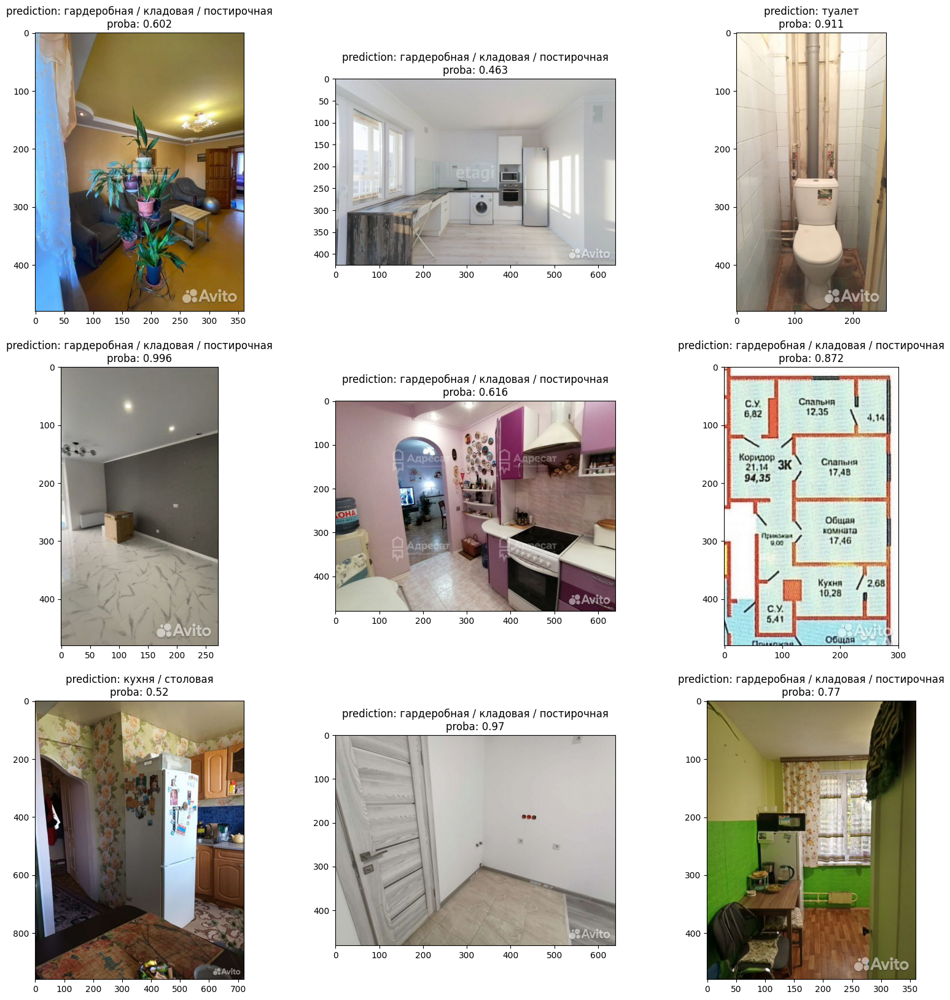

In [ ]:
# Смотрим на предсказания
sample_df = test_df.sample(9).reset_index()

plot_imgs_with_labels(
    sample_df['img_path'],
    (sample_df['pred_class'], 'prediction'), (sample_df['proba'].round(3), 'proba')
)

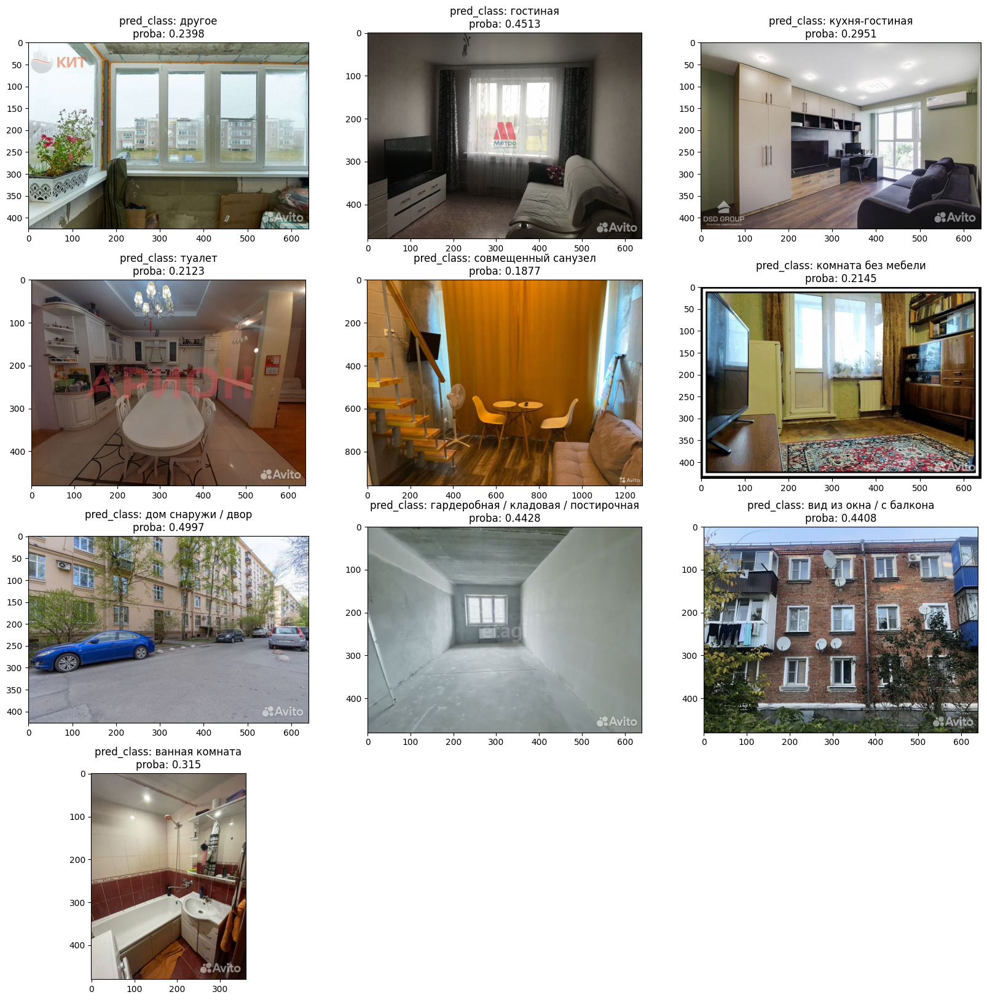

In [ ]:
# семплинг по неуверенности
margin_indxs, counts = margin_with_diversity(probas, sample_size=10)
sample_df = test_df.iloc[margin_indxs].sample(10).reset_index()
                            
plot_imgs_with_labels(sample_df['img_path'], (sample_df['pred_class'], 'pred_class'), 
                      (sample_df['proba'], 'proba'))

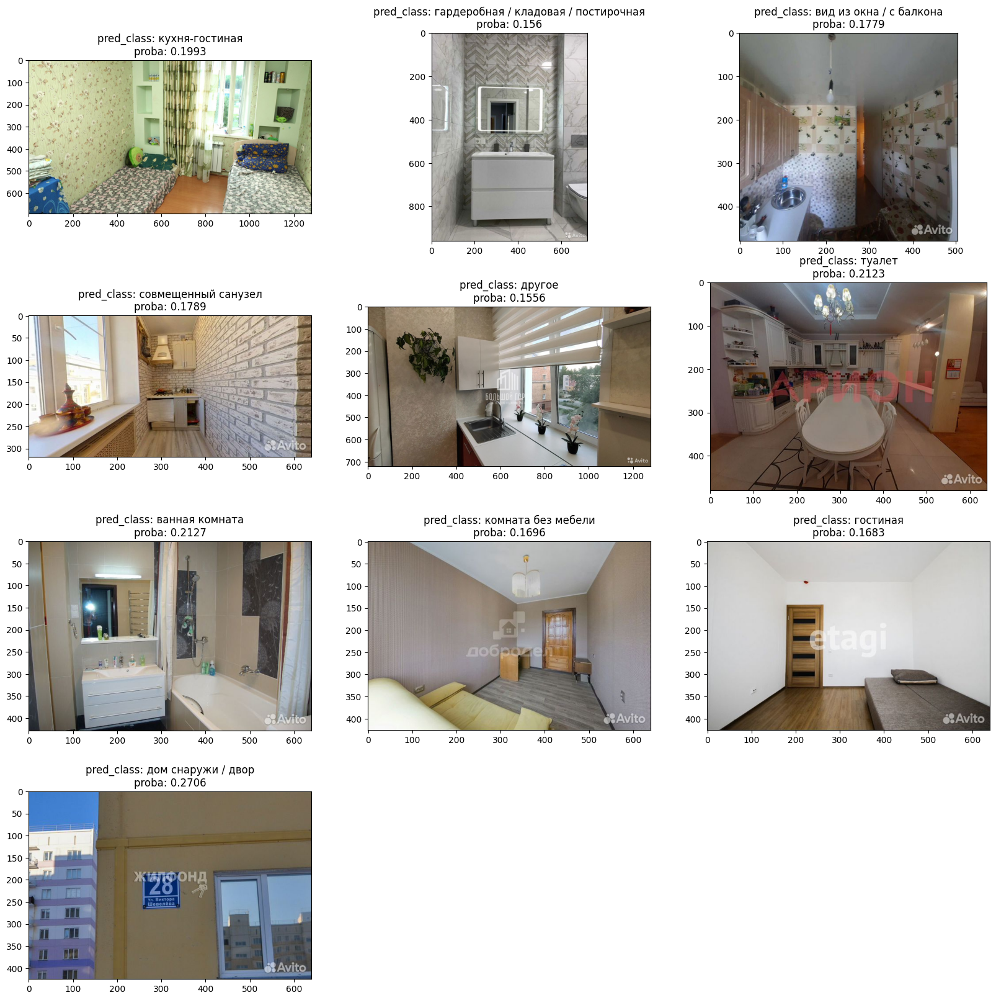

In [ ]:
# второй вариант семплинга по неуверенности
max_min_indxs, counts = max_min_with_diversity(probas, sample_size=10)
sample_df = test_df.iloc[max_min_indxs].sample(10).reset_index()
                            
plot_imgs_with_labels(sample_df['img_path'], (sample_df['pred_class'], 'pred_class'), 
                      (sample_df['proba'], 'proba'))

## Perform

In [ ]:
test_df[['perform_top_microcat_name', 'perform_top_microcat_prob']]

,perform_top_microcat_name,perform_top_microcat_prob
0,"Сантехника, водоснабжение и сауна",0.987846
1,Автодома,0.238401
2,Двери,0.836289
3,"Сантехника, водоснабжение и сауна",0.721677
4,Автодома,0.492245
...,...,...
47998,Окна и балконы,0.775538
47999,Путешествия,0.284218
48000,Кухонные гарнитуры,0.631377
48001,Путешествия,0.481765


In [ ]:
test_df['perform_top_microcat_name'].value_counts()[:10]

Путешествия                          7422
Сантехника, водоснабжение и сауна    4980
Потолки                              4334
Кухонные гарнитуры                   3951
Окна и балконы                       3772
Другое                               3620
Кровати, диваны и кресла             2667
Двери                                2474
Шкафы, комоды и стеллажи             2346
Текстиль и ковры                     1956
Name: perform_top_microcat_name, dtype: int64

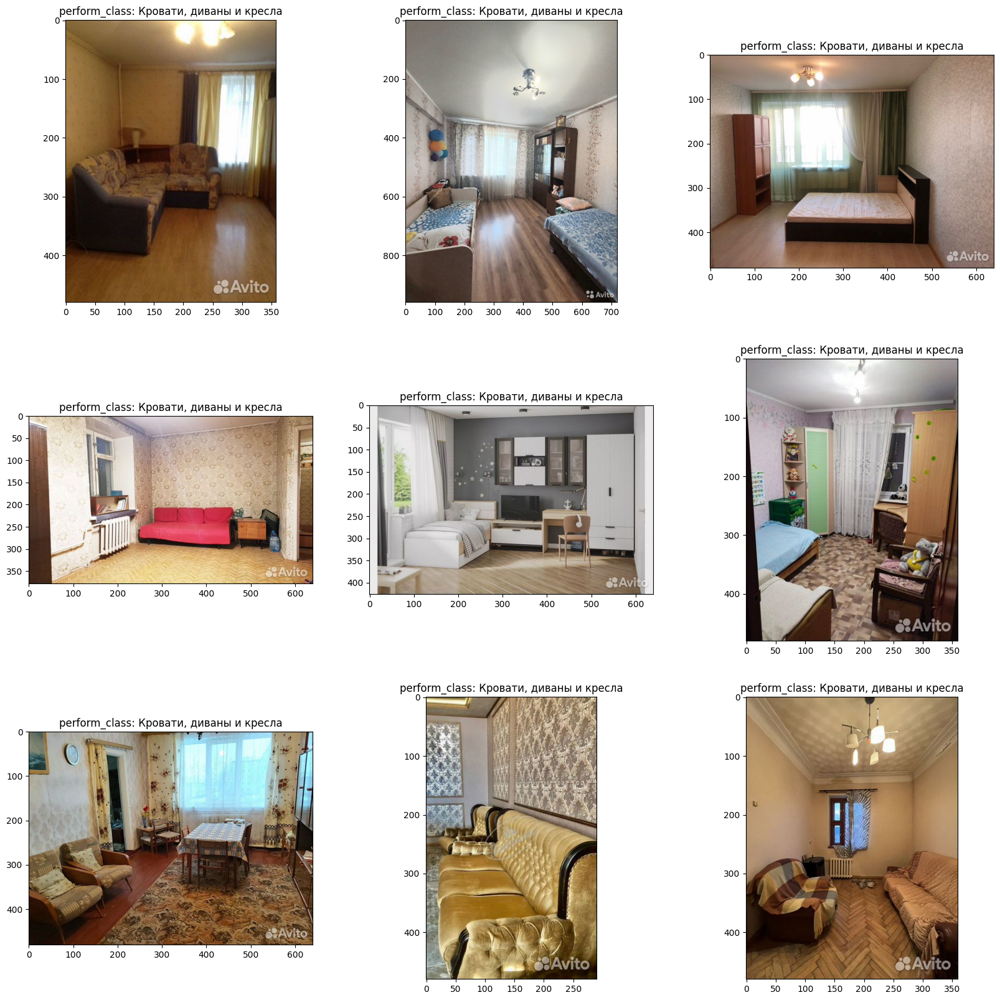

In [ ]:
sample_df = test_df[(test_df['perform_top_microcat_name'] == 'Кровати, диваны и кресла'
                      ) & (random_df['perform_top_microcat_prob'] > 0.65)
                     ].sample(9).reset_index()

plot_imgs_with_labels(sample_df['img_path'], (sample_df['perform_top_microcat_name'], 'perform_class'))

In [ ]:
test_df['perform_top_other_classes_value'].value_counts()

Ванная                  10654
Комната                  8439
Дом снаружи              7864
Кухня                    7551
Бетон                    6014
Планировка               2677
Скриншоты переписок      2252
Дети                      996
Планировка квартиры       784
Порнография               320
Человек                   232
Алкоголь                  136
Автомобильные номера       43
Печать                     16
Медикаменты                 8
Сигареты                    4
Вооруженный                 4
Банковские карты            4
Огнестрельное оружие        3
Свастика                    2
Name: perform_top_other_classes_value, dtype: int64

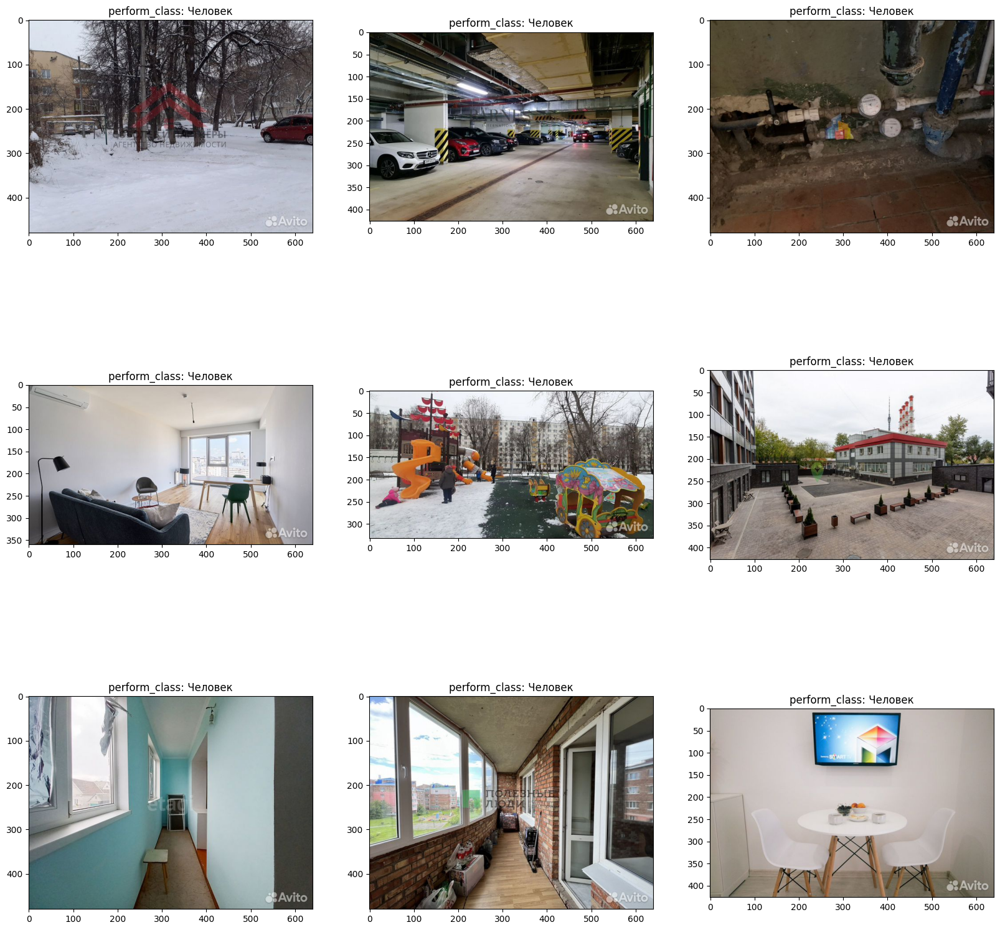

In [ ]:
sample_df = test_df[(test_df['perform_top_other_classes_value'] == 'Человек'
                      ) & (test_df['perform_top_other_classes_prob'] > 0.01)
                     ].sample(9).reset_index()

plot_imgs_with_labels(sample_df['img_path'], (sample_df['perform_top_other_classes_value'], 'perform_class'))

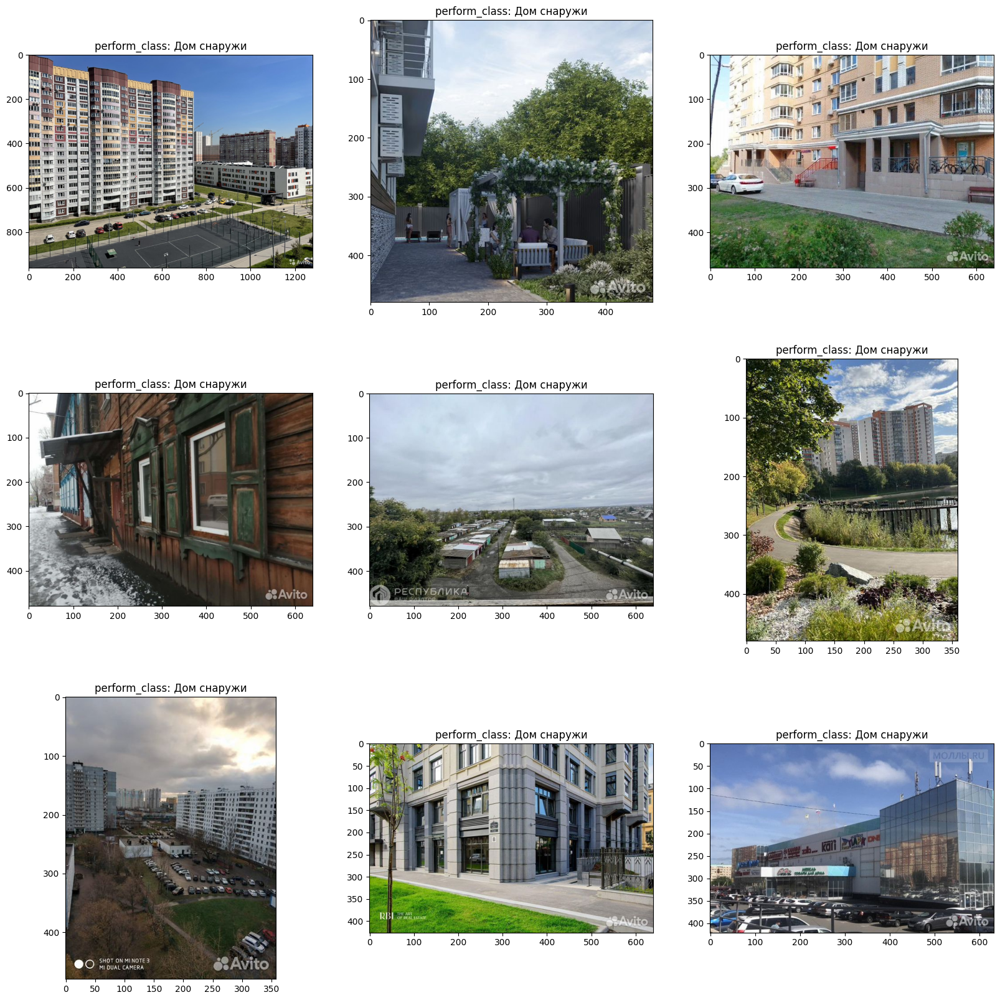

In [ ]:
sample_df = test_df[(test_df['perform_top_other_classes_value'] == 'Дом снаружи'
                      ) & (test_df['perform_top_other_classes_prob'] > 0.6)
                     ].sample(9).reset_index()

plot_imgs_with_labels(sample_df['img_path'], (sample_df['perform_top_other_classes_value'], 'perform_class'))